# ILC subsets - trajectory analysis

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import scanpy as sc

In [ ]:
import os,sys
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy.sparse
# import anndata
import seaborn as sns

In [ ]:
import petsc4py

In [ ]:
# ## import utils
# cwd = '../utils/'
# sys.path.append(cwd)

# import genes
# import panfetal_utils

In [ ]:
import cellrank
from cellrank.tl.kernels import ConnectivityKernel, PseudotimeKernel

In [ ]:
import scvelo as scv

In [ ]:
import fa2

In [ ]:
# import milopy.core as milo
# import milopy.plot as milopl

In [ ]:
figdir = "/home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/"
if os.path.exists(figdir):
    sc.settings.figdir = figdir
    scv.settings.figdir = figdir
else:
    os.mkdir(figdir)
    sc.settings.figdir = figdir
    scv.settings.figdir = figdir
 

### Load ILC cells data

Load the NKT subset

In [ ]:
data_dir="/nfs/team205/ed6/data/Fetal_immune/"
timestamp="20210429"

In [ ]:
split="LYMPHOID"
adata = sc.read_h5ad(data_dir + 'PAN.A01.v01.entire_data_normalised_log.{t}.{s}.embedding.h5ad'.format(t=timestamp, s=split))
adata.var_names_make_unique()

Load annotation

In [ ]:
anno_dir = "/nfs/team205/ed6/bin/Pan_fetal_immune/metadata/manual_annotation/"
anno_df = pd.read_csv(anno_dir + 'PAN.A01.v01.entire_data_normalised_log.20210429.LYMPHOID.csv', index_col=0)

adata.obs = pd.concat([adata.obs, anno_df],1).loc[adata.obs_names]

In [ ]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.umap(adata, color="anno_lvl_2", legend_loc="on data")

Subset to ILC cells and progenitors (excluding cycling ILCs, as they dominate the RNA velocity estimation)

In [209]:
subset_annos = ['HSC_MPP','ELP','ILCP','ILC2','NCR2+ILC3','NCR2-ILC3']

In [ ]:
ilc_adata = adata[adata.obs["anno_lvl_2"].isin(subset_annos)]

ilc_adata

We subset to 3GEX data to use for velocity analysis (repeating embedding)

In [ ]:
ilc_adata = ilc_adata[ilc_adata.obs["method"] == '3GEX']

In [ ]:
sc.pp.neighbors(ilc_adata, use_rep = "X_scvi", n_neighbors = 15, key_added="scvi")

In [ ]:
sc.tl.draw_graph(ilc_adata, neighbors_key="scvi")

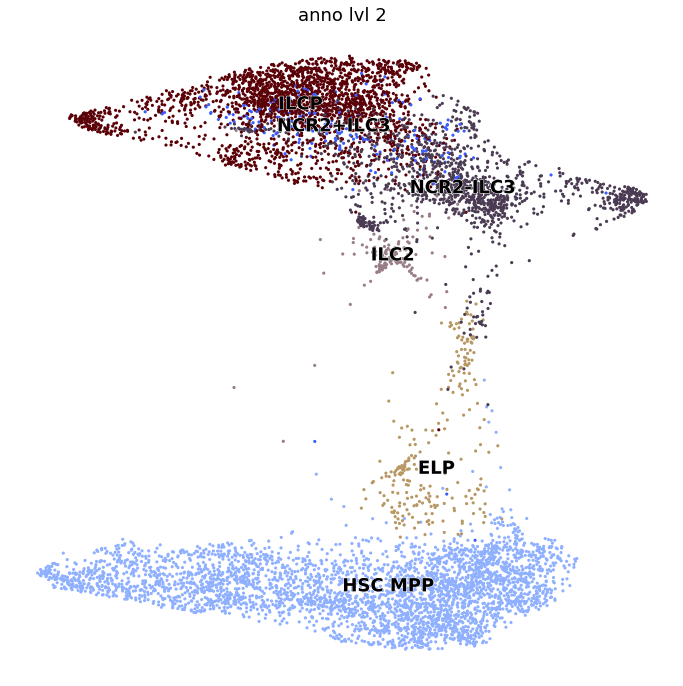

In [156]:
plt.rcParams["figure.figsize"] = [12,12]
scv.pl.draw_graph(ilc_adata, color="anno_lvl_2", legend_loc="on data", size=40)

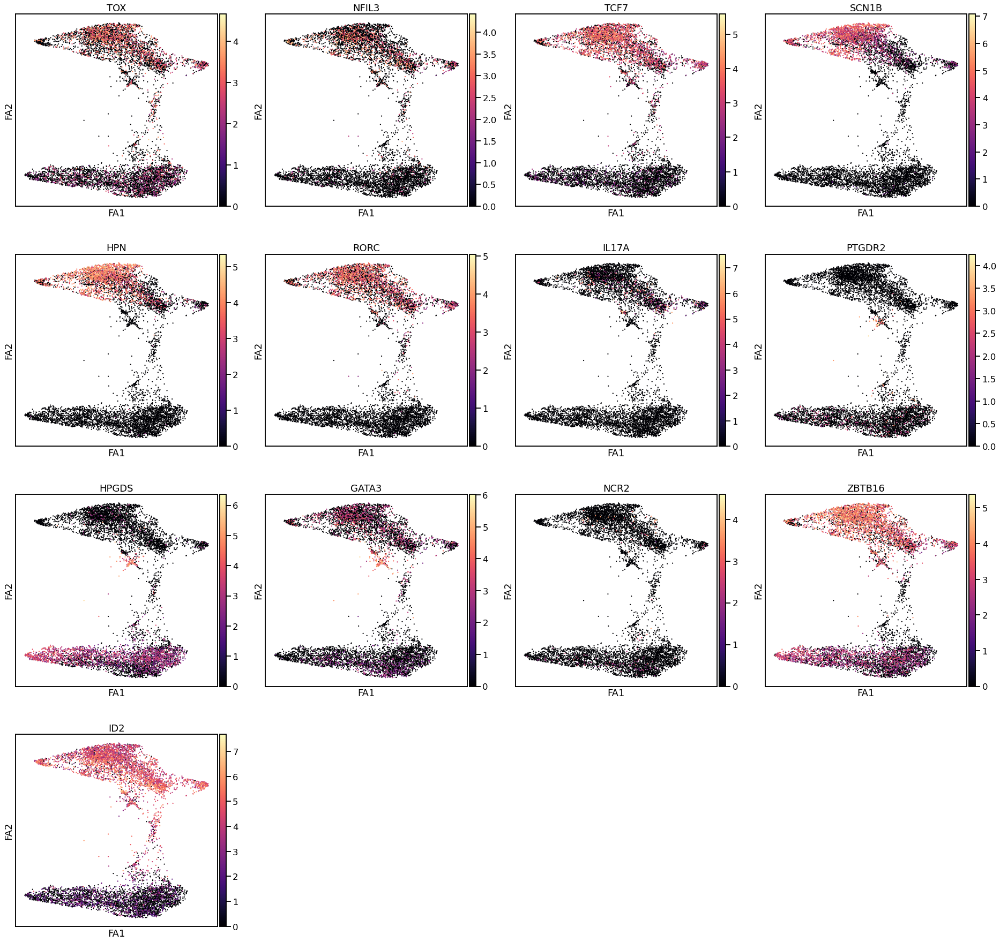

In [157]:
ilc_genes = [
    'TOX',"NFIL3","TCF7", ## Precursors
    'SCN1B', 'HPN', ##ILCP
    'RORC', 'IL17A', ## ILC3
    'PTGDR2','HPGDS','GATA3', ## ILC2
    'NCR2',
    "ZBTB16", "ID2"
]

plt.rcParams["figure.figsize"] = [7,7]
sc.pl.draw_graph(ilc_adata, color=ilc_genes, legend_loc="on data", size=20, cmap="magma")

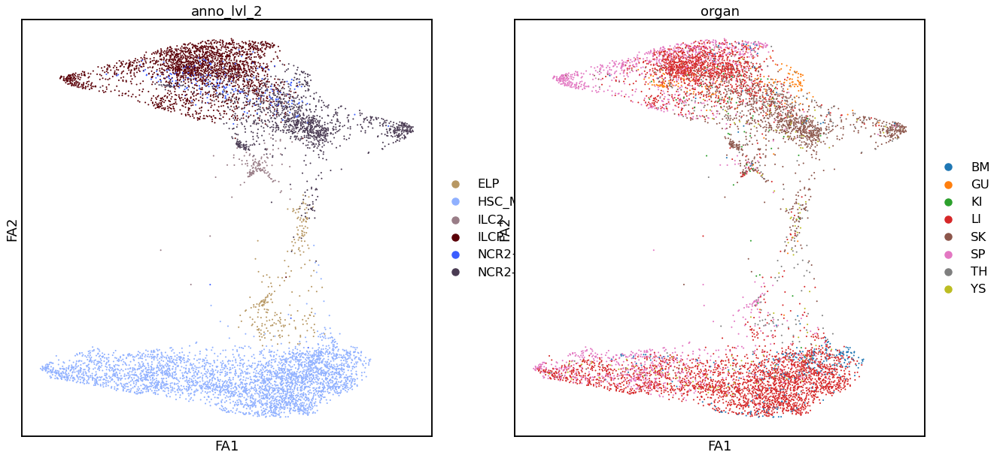

In [158]:
plt.rcParams["figure.figsize"] = [10,10]
sc.pl.draw_graph(ilc_adata, color=["anno_lvl_2", 'organ'])

Visualize diffusion map

In [ ]:
sc.tl.diffmap(ilc_adata, neighbors_key="scvi")

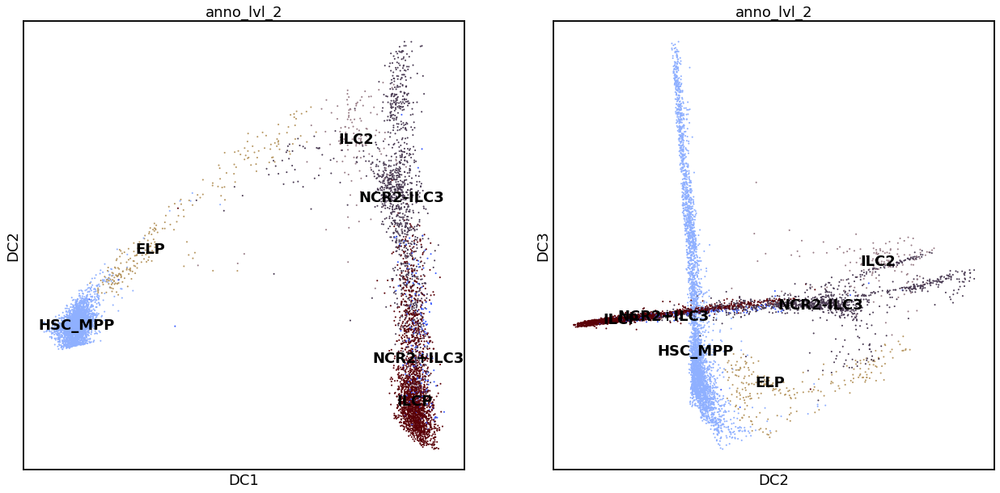

In [159]:
sc.pl.diffmap(ilc_adata, color="anno_lvl_2", legend_loc="on data", components=['1,2','2,3'])

Exclude cycling cells (they confound velocity estimation)

Trying to set attribute `.obs` of view, copying.


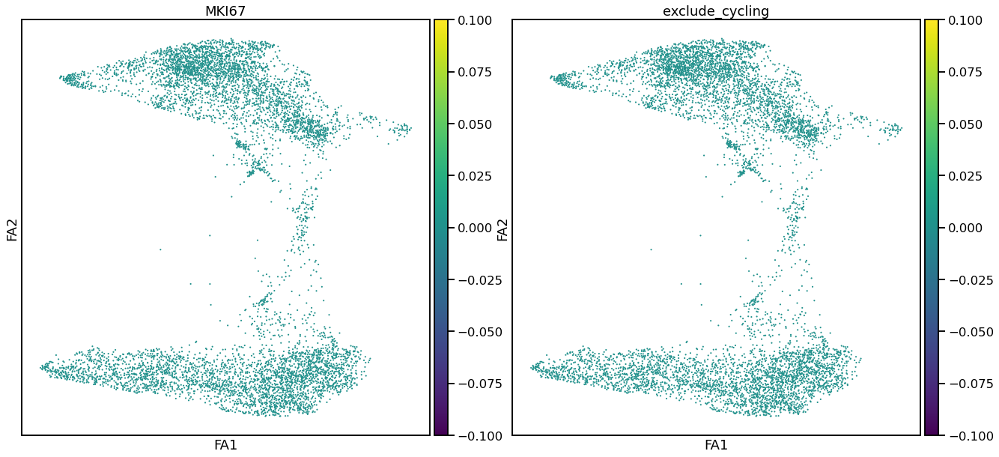

In [164]:
ilc_adata.obs['exclude_cycling'] = (ilc_adata[:,"MKI67"].X.toarray() >= 1).astype('int')
sc.pl.draw_graph(ilc_adata, color=["MKI67", "exclude_cycling"], legend_loc="on data")

In [163]:
ilc_adata = ilc_adata[ilc_adata.obs["exclude_cycling"] == 0]

In [165]:
sc.pp.neighbors(ilc_adata, use_rep = "X_scvi", n_neighbors = 15, key_added="scvi")

In [166]:
sc.tl.draw_graph(ilc_adata, neighbors_key="scvi")

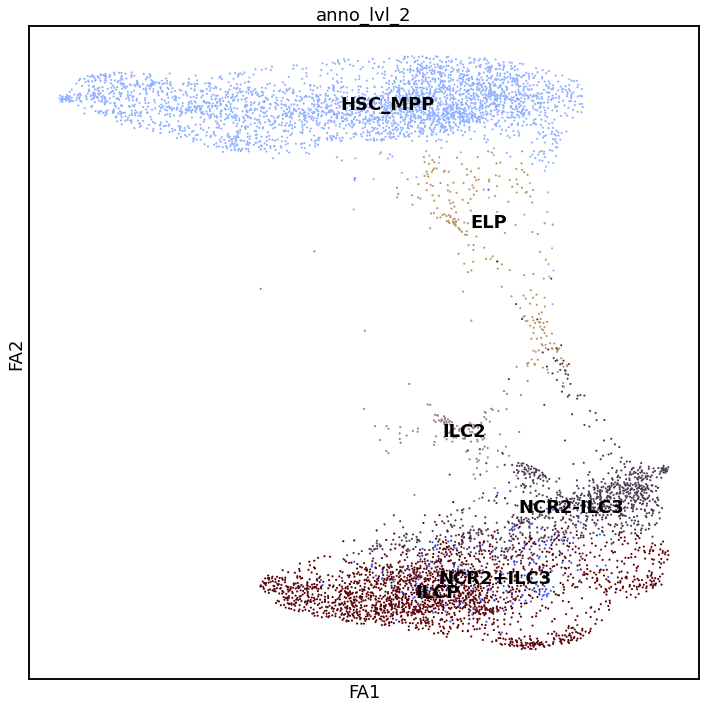

In [167]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.draw_graph(ilc_adata, color="anno_lvl_2", legend_loc="on data")

In [168]:
ilc_adata.write_h5ad(data_dir + "tmp/ILC_adata.h5ad")


In [169]:
ilc_adata=sc.read_h5ad(data_dir + "tmp/ILC_adata.h5ad")

### Load spliced/unspliced counts for RNA velocity

We load and save just the samples that contain ILC cells

In [ ]:
indir = '/nfs/team205/ed6/data/Fetal_immune/tic-908/'

In [ ]:
import os

def convert_obs_name(obs_name):
    obs_name = "_".join(obs_name.split(":")).rstrip("x")
    return(obs_name)

def read_velocyto(indir, file):
    adata = scv.read(indir + file + ".loom", cache=False)
    adata.obs_names = [convert_obs_name(x) for x in adata.obs_names]
    ## Check that all the cells from that file are in the adata
#     pfi_obs.index[pfi_obs.file == file].isin(adata)
    return(adata)

velo_files = [x.split(".loom")[0] for x in os.listdir(indir)]

infiles = ilc_adata.obs["Sample.lanes"].unique()[ilc_adata.obs["Sample.lanes"].unique().isin(velo_files)]

In [ ]:
ilc_adata = ilc_adata[ilc_adata.obs["Sample.lanes"].isin(infiles)]
# ilc_adata.obs_names = [x.split("_")[3] + "_" + x.split("_")[5] for x in ilc_adata.obs_names]

In [ ]:
all_adatas = []
for f in infiles:
    adata = read_velocyto(indir, f)
    adata.var_names_make_unique()
    adata.obs_names = ["-".join(x.split("_")) for x in adata.obs_names]
    adata = adata[adata.obs_names.isin(ilc_adata.obs_names)]
    del adata.layers["ambiguous"]
    del adata.layers["matrix"]
#     scvelo_adata = scvelo_adata.concatenate(adata)
    all_adatas.append(adata)

In [ ]:
scvelo_adata = anndata.concat(all_adatas)

In [ ]:
scvelo_adata.write_h5ad(data_dir + "tmp/velocity_adata.h5ad")

In [170]:
scvelo_adata = sc.read_h5ad(data_dir + "tmp/velocity_adata.h5ad")

Assign clusters

In [171]:
scvelo_adata = scvelo_adata[scvelo_adata.obs_names.isin(ilc_adata.obs_names)]
scvelo_adata.obs = ilc_adata[scvelo_adata.obs_names].obs.copy()
scvelo_adata.obs.value_counts("anno_lvl_2")
scvelo_adata = scvelo_adata[scvelo_adata.obs["method"] == "3GEX"]

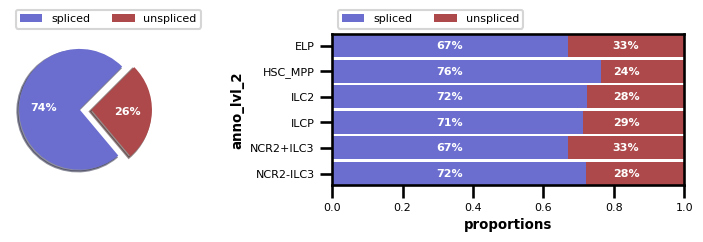

In [172]:
scv.pl.proportions(scvelo_adata, groupby='anno_lvl_2')

### Preprocessing for RNA velocity analysis

Following scVelo vignette https://scvelo.readthedocs.io/VelocityBasics.html

In [173]:
## Add embeddings to spliced/unspliced anndata object
scvelo_adata.obsm["X_scvi"] = ilc_adata[scvelo_adata.obs_names].obsm["X_scvi"]
scvelo_adata.obsm["X_draw_graph_fa"] = ilc_adata[scvelo_adata.obs_names].obsm["X_draw_graph_fa"]
scvelo_adata.uns['draw_graph'] = ilc_adata.uns['draw_graph'].copy()
scvelo_adata.obsm["X_draw_graph_fa"] =scvelo_adata.obsm["X_draw_graph_fa"].toarray()

In [174]:
scv.pp.filter_and_normalize(scvelo_adata, min_shared_counts=10, n_top_genes=3000)
sc.pp.neighbors(scvelo_adata, n_pcs=30, n_neighbors=30, use_rep="X_scvi")

Filtered out 24226 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 3000 highly variable genes.
Logarithmized X.


In [175]:
scv.pp.moments(scvelo_adata, n_pcs=None, n_neighbors=None)

computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


### Estimate velocity with dynamical model

i.e. not assuming the same rate of transcription/degradation for all genes. This also allows to estimate a 'latent time' for all cells

In [176]:
scv.tl.recover_dynamics(scvelo_adata)

recovering dynamics (using 1/60 cores)



    finished (0:10:16) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scvelo/tools/dynamical_model.py:697: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scvelo/tools/dynamical_model.py:700: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.t, dm.tau, dm.t_, dm.pars[4]]) * dm.m[-1]


In [177]:
scv.tl.velocity(scvelo_adata, mode='dynamical')
scv.tl.velocity_graph(scvelo_adata)

computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [178]:
scv.tl.latent_time(scvelo_adata)

computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:03) --> added 
    'latent_time', shared time (adata.obs)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


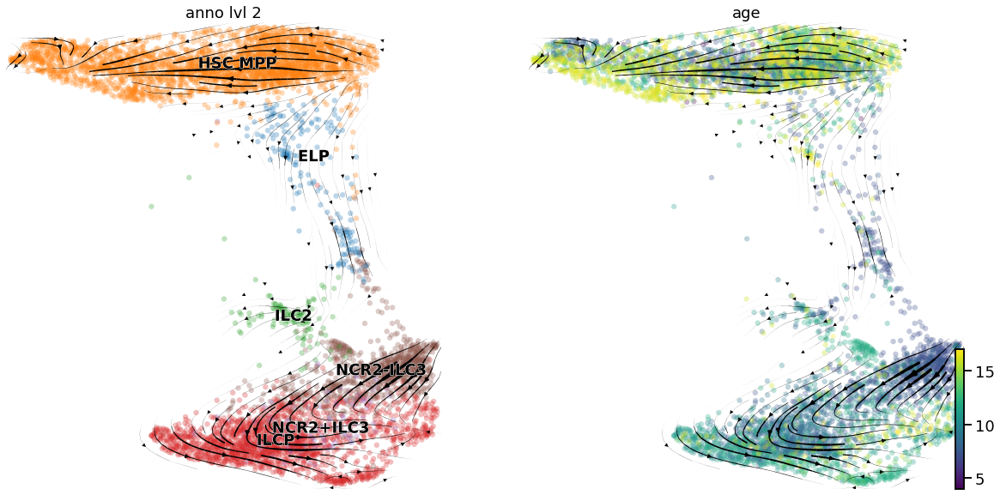

In [179]:
plt.rcParams["figure.figsize"] = [10,10]
scvelo_adata.obs["age"] = scvelo_adata.obs["age"].astype("float64")
scv.pl.velocity_embedding_stream(scvelo_adata, basis="X_draw_graph_fa", color=["anno_lvl_2", 'age'], linewidth=2)

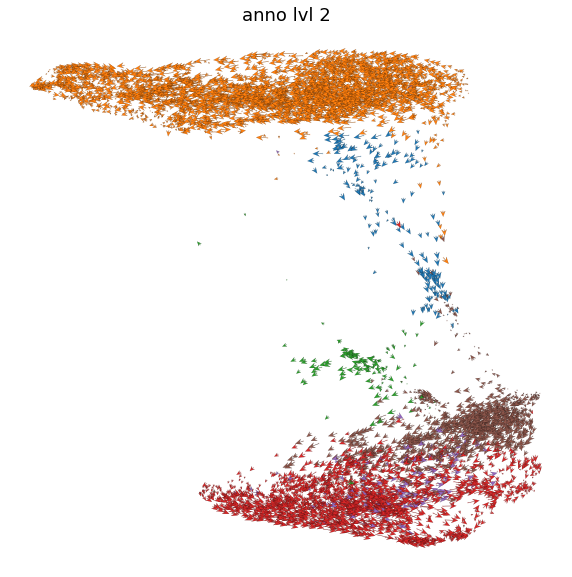

In [180]:
scv.pl.velocity_embedding(scvelo_adata, basis="X_draw_graph_fa", color="anno_lvl_2", arrow_length=5, arrow_size=2)

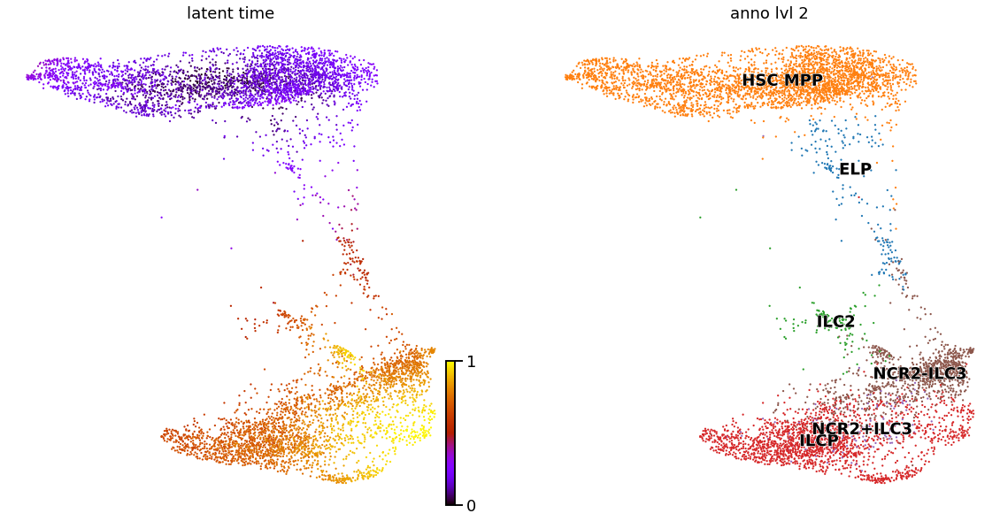

In [181]:
plt.rcParams["figure.figsize"] = [10,10]
scv.pl.scatter(scvelo_adata, color=['latent_time',"anno_lvl_2"], color_map='gnuplot', basis="X_draw_graph_fa", legend_loc="on data")

### Find dynamical genes
Top 50 genes with highest likelihood of the dynamical model fit (compared to linear model of spliced/unspliced reads) 

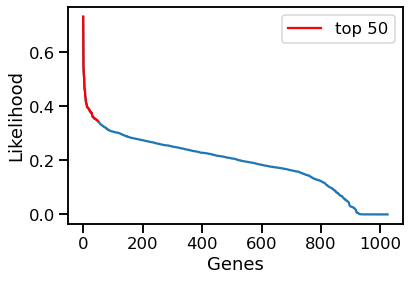

In [192]:
lkh = scvelo_adata.var['fit_likelihood'].sort_values(ascending=False).values
plt.rcParams["figure.figsize"] = [6,4]
plt.plot(lkh);
plt.xlabel("Genes");
plt.ylabel("Likelihood");
plt.plot(lkh[:50], 'r', label="top 50");
plt.legend()

In [194]:
top_genes = scvelo_adata.var['fit_likelihood'].sort_values(ascending=False).index[:50]

We inspect the spliced/unspliced profiles to make sure the fit looks reasonable

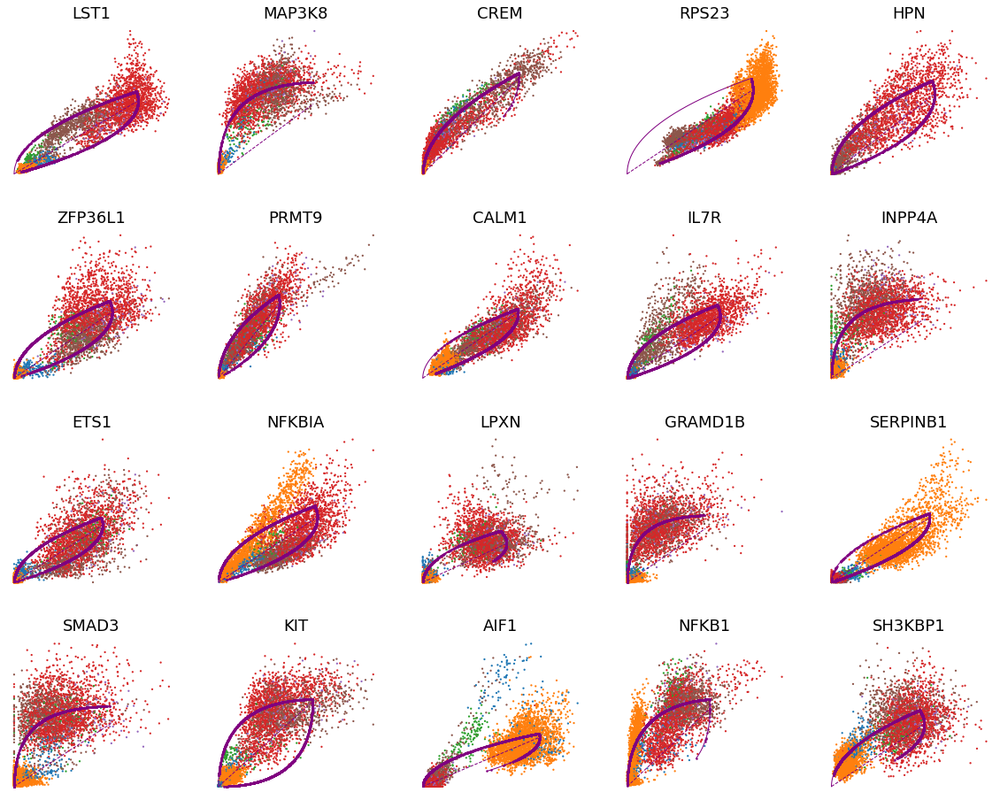

In [195]:
plt.rcParams["figure.figsize"] = [4,4]
scv.pl.scatter(scvelo_adata, basis=top_genes[:20], ncols=5, frameon=False, color="anno_lvl_2")

Visualize expression of dynamical genes over the latent time axis

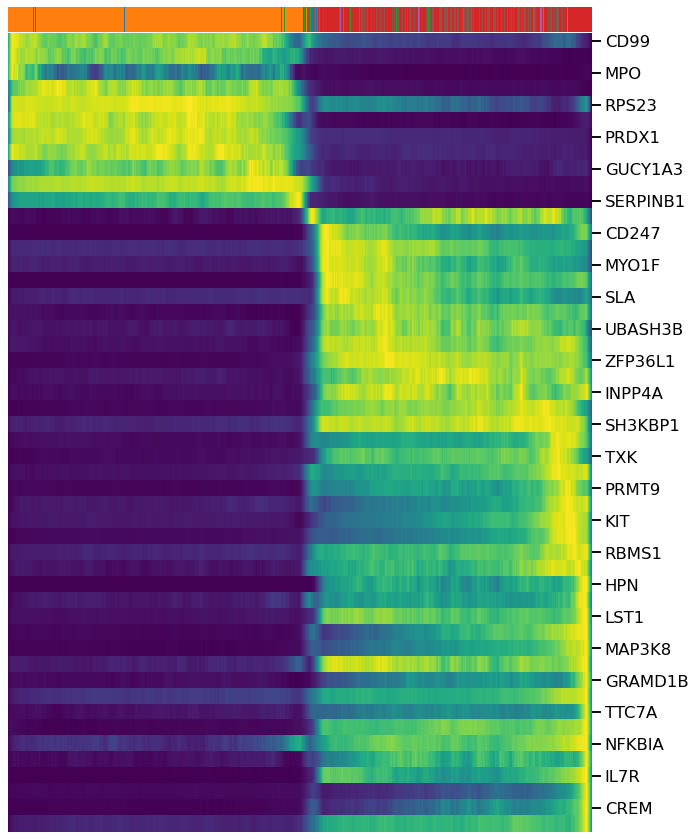

In [197]:
scv.pl.heatmap(scvelo_adata, var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])

Order top genes as in the heatmap (by max expression in latent time) and save

In [198]:
xkey = 'Ms'
tkey = 'latent_time'
n_convolve = 100

var_names = top_genes

time = scvelo_adata[scvelo_adata.obs.anno_lvl_2=="ELP"].obs[tkey].values
time = time[np.isfinite(time)]

df = pd.DataFrame(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="ELP"][:, var_names].layers[xkey][np.argsort(time)], columns=var_names)

if n_convolve is not None:
    weights = np.ones(n_convolve) / n_convolve
    for i, gene in enumerate(var_names):
        df[gene] = np.convolve(df[gene].values, weights, mode='same')

max_sort = np.argsort(np.argmax(df.values, axis=0))
sorted_top_genes = top_genes[max_sort]

sorted_top_genes.to_series().to_csv("/home/jovyan/mount/gdrive/Pan_fetal/significant_genes/ILC_velocity_genes.csv")
pd.read_csv("/home/jovyan/mount/gdrive/Pan_fetal/significant_genes/ILC_velocity_genes.csv")[["Gene"]].to_csv("/home/jovyan/mount/gdrive/Pan_fetal/significant_genes/ILC_velocity_genes.csv")


Visualize expression of dynamic genes over latent time for each cluster separately

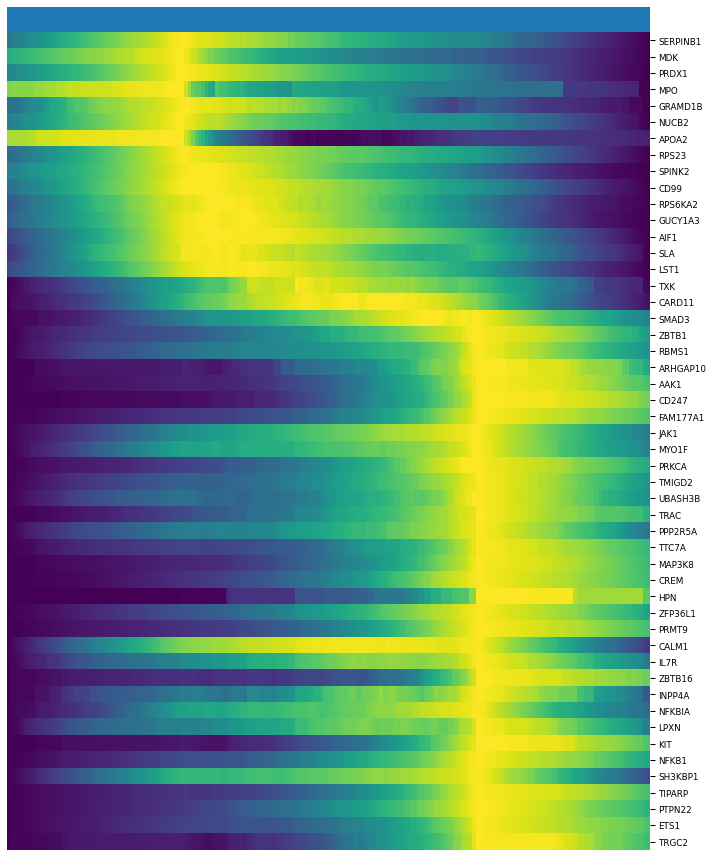

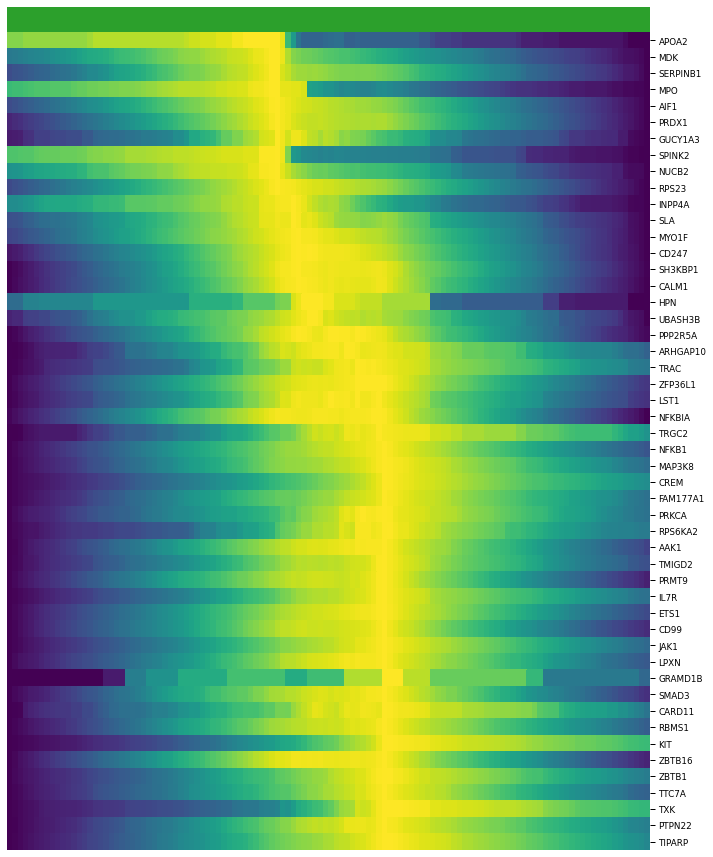

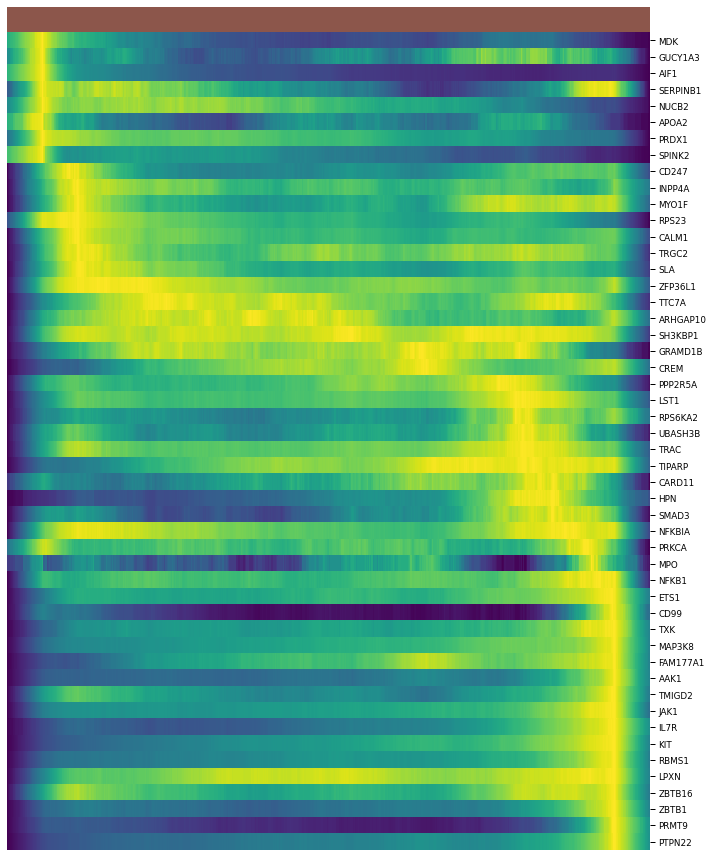

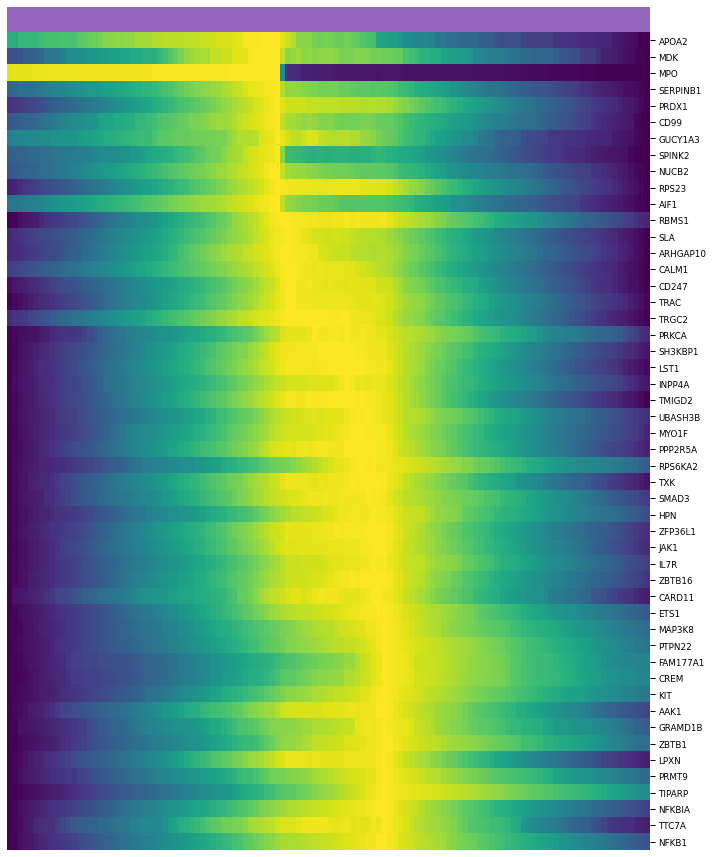

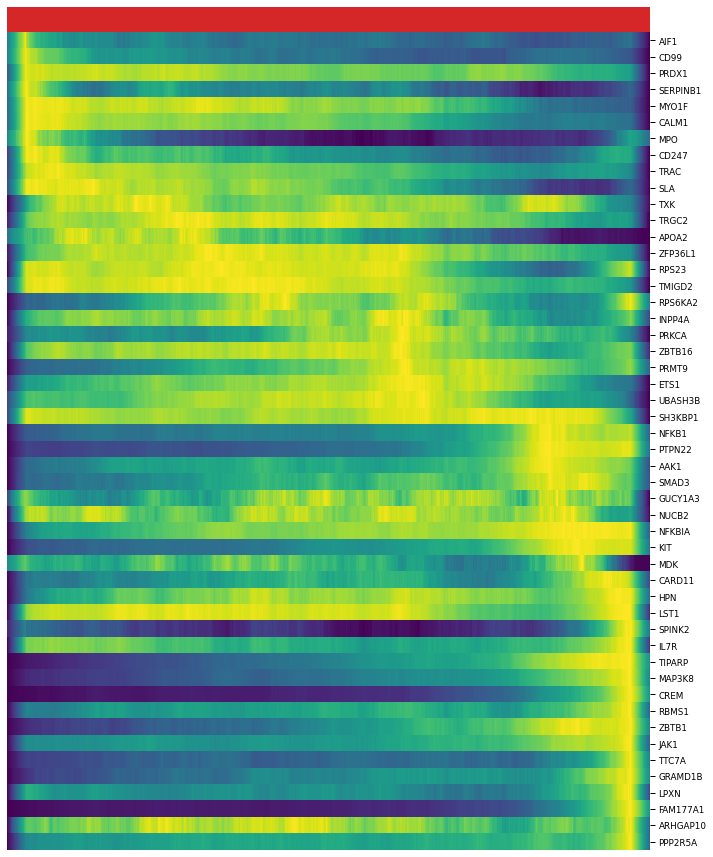

In [199]:
sns.set_context("paper")
scv.pl.heatmap(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="ELP"], var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])
scv.pl.heatmap(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="ILC2"], var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])
scv.pl.heatmap(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="NCR2-ILC3"], var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])
scv.pl.heatmap(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="NCR2+ILC3"], var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])
scv.pl.heatmap(scvelo_adata[scvelo_adata.obs.anno_lvl_2=="ILCP"], var_names=top_genes, sortby='latent_time', col_color='anno_lvl_2', n_convolve=100, figsize=[10,12])

Visualize expression of dynamic genes in force atlas embedding

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_top_likelihood_genes_full_0_20.pdf


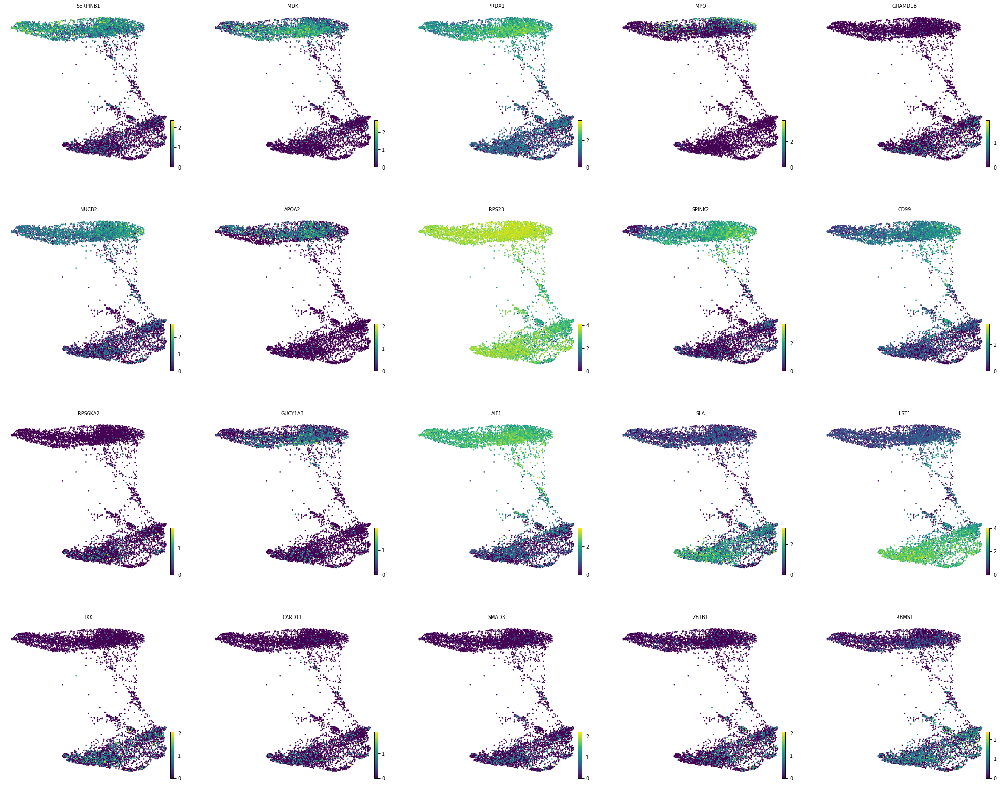

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_top_likelihood_genes_full_20_40.pdf


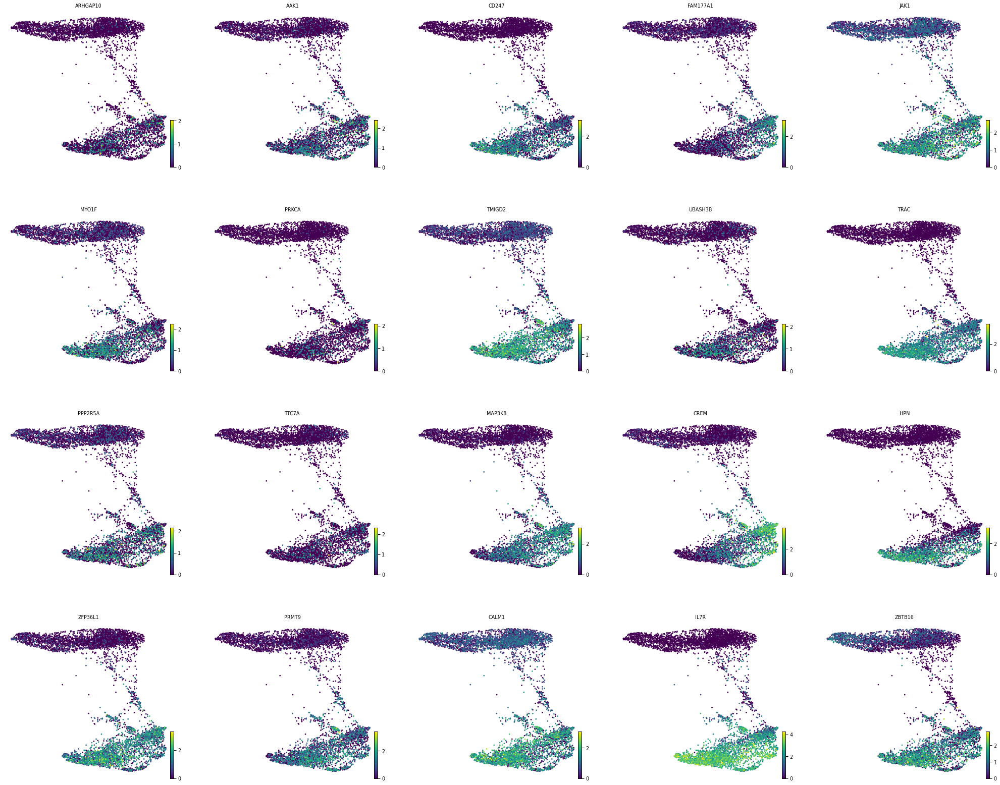

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_top_likelihood_genes_full_40_50.pdf


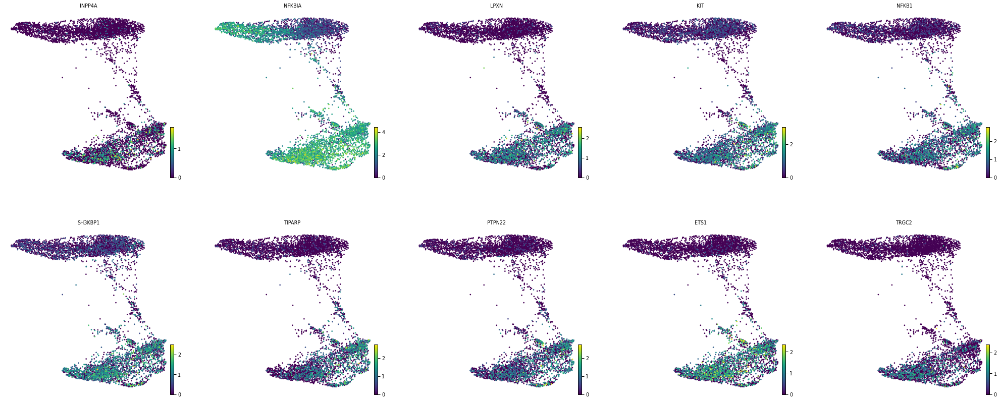

In [200]:
plt.rcParams["figure.figsize"] = [7,7]
scv.pl.draw_graph(scvelo_adata, color=sorted_top_genes[0:20], ncols=5, size=30, save="top_likelihood_genes_full_0_20.pdf")
scv.pl.draw_graph(scvelo_adata, color=sorted_top_genes[20:40], ncols=5, size=30, save="top_likelihood_genes_full_20_40.pdf")
scv.pl.draw_graph(scvelo_adata, color=sorted_top_genes[40:50], ncols=5, size=30, save="top_likelihood_genes_full_40_50.pdf")

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_ilc_genes_fa2.pdf


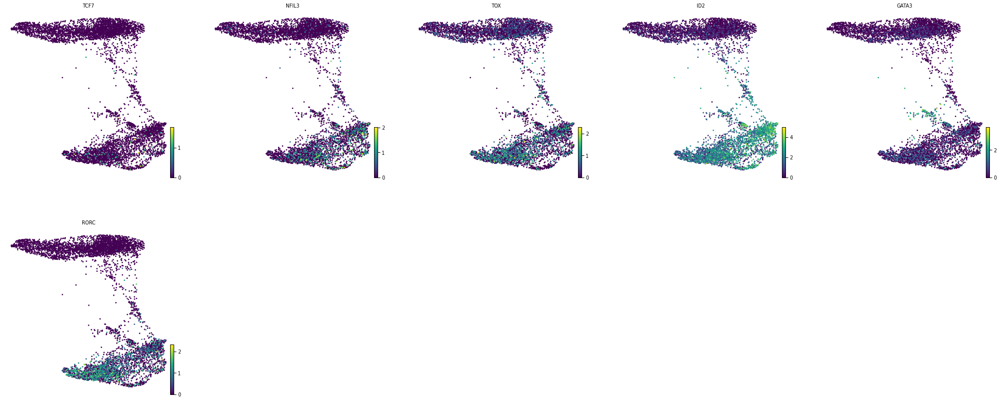

In [201]:
ilc_genes = ['TCF7', 'NFIL3', 'TOX', 'ID2', 'GATA3', 'RORC']
scv.pl.draw_graph(scvelo_adata, color=ilc_genes, ncols=5, size=30, save="ilc_genes_fa2.pdf")

#### Test for differential kinetics between clusters

In [202]:
scv.tl.differential_kinetic_test(scvelo_adata, var_names=top_genes, groupby='anno_lvl_2')

testing for differential kinetics
    finished (0:00:10) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


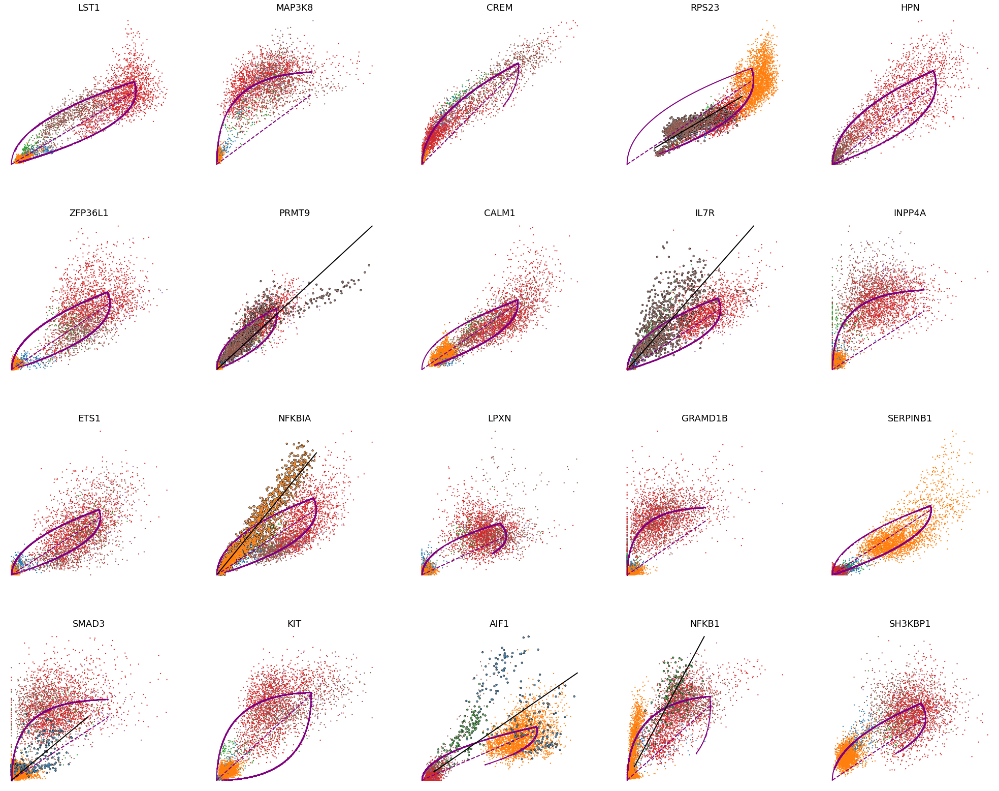

In [203]:
sns.set_context("talk")
plt.rcParams["figure.figsize"] =[7,7]
scv.pl.scatter(scvelo_adata, basis=top_genes[:20], ncols=5, add_outline='fit_diff_kinetics', linewidth=2, add_linfit=True, frameon=False)


Recompute velocity accounting for differential kinetics

In [204]:
scv.tl.velocity(scvelo_adata, diff_kinetics=True)
scv.tl.velocity_graph(scvelo_adata)

computing velocities
    finished (0:00:02) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:10) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:01) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


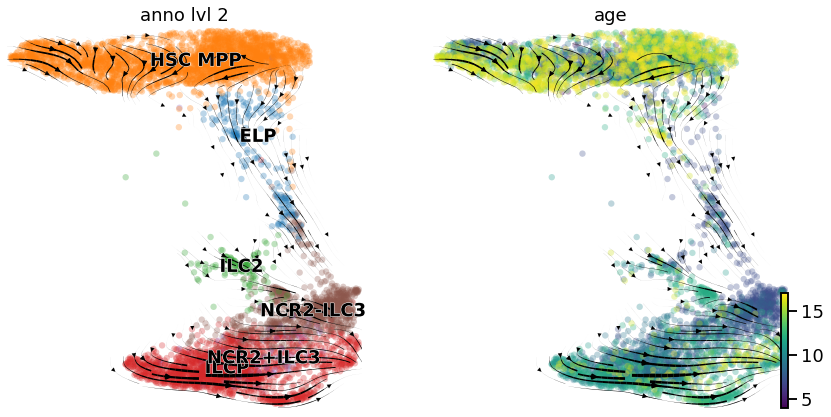

In [205]:
scv.pl.velocity_embedding_stream(scvelo_adata, basis="X_draw_graph_fa", color=["anno_lvl_2", 'age'], linewidth=2)

Get cluster specific likelihoods

In [206]:
scv.tl.rank_dynamical_genes(scvelo_adata, groupby='anno_lvl_2')
df = scv.get_df(scvelo_adata, 'rank_dynamical_genes/names')
df

ranking genes by cluster-specific likelihoods
    finished (0:00:04) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,ELP,HSC_MPP,ILC2,ILCP,NCR2+ILC3,NCR2-ILC3
0,RPS23,RPS23,CREM,LST1,LST1,LST1
1,SH3KBP1,AIF1,ZFP36L1,RPS23,RPS23,NFKBIA
2,RPL41,PTMA,ETS1,MAP3K8,NFKBIA,ZFP36L1
3,ZNF331,GUCY1A3,PRMT9,NFKBIA,CREM,CREM
4,JAK1,MDK,PRKCA,HPN,MAP3K8,MAP3K8
...,...,...,...,...,...,...
95,XBP1,HCST,BHLHE40,CAMK2D,TMEM2,RASSF5
96,IQGAP1,HPGDS,CHD1,TOX,SLA,ABCA5
97,EZR,FYB,TGIF1,ELL2,RPS28,NFKB2
98,MZB1,PDCD4,TES,TANC1,INPP4B,AREG


saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_HSC_MPP.pdf


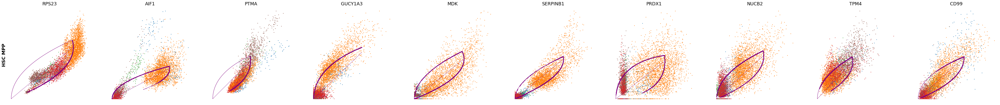

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_ELP.pdf


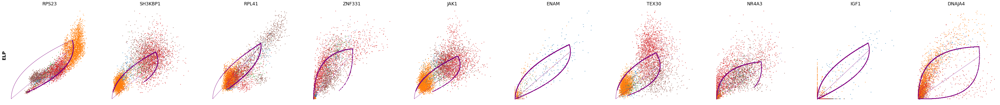

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_ILCP.pdf


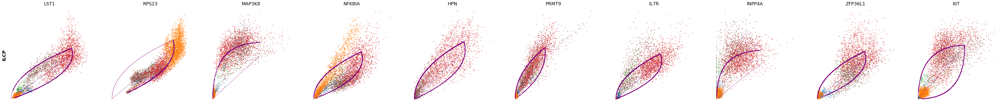

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_ILC2.pdf


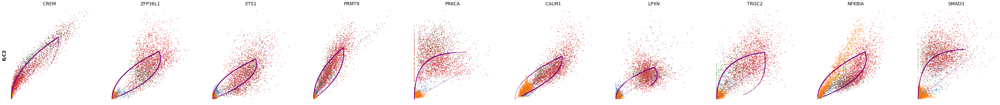

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_NCR2+ILC3.pdf


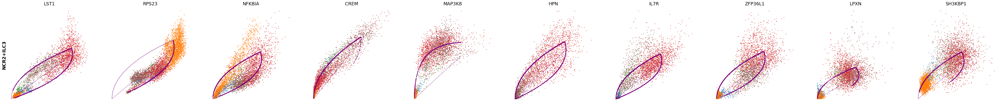

saving figure to file /home/jovyan/mount/gdrive/Pan_fetal/Updates_and_presentations/figures/ILC_analysis/scvelo_anno_dynamics_NCR2-ILC3.pdf


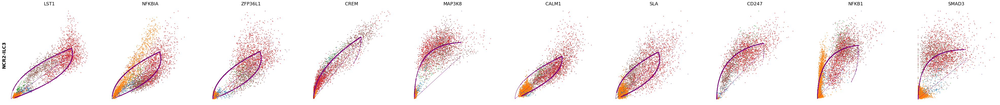

In [210]:
sns.set_context("talk")
for cluster in subset_annos:
    scv.pl.scatter(scvelo_adata, df[cluster][:10], ylabel=cluster, frameon=False, color="anno_lvl_2", save="anno_dynamics_{c}.pdf".format(c=cluster))

## Infer putative terminal and initial states with CellRank

W/o imposing number of terminal states

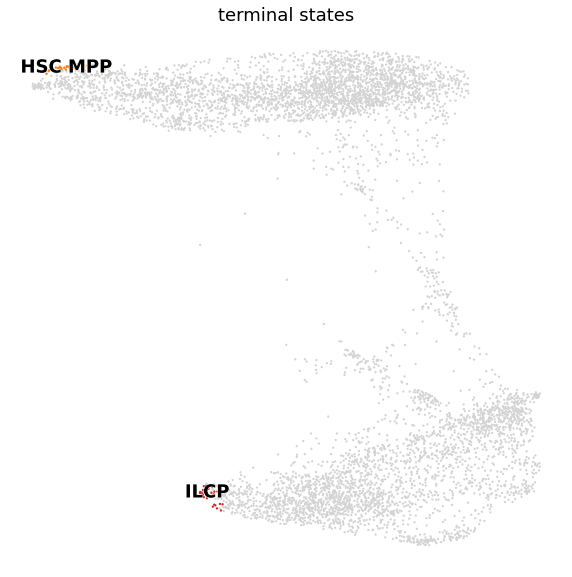

In [276]:
cellrank.tl.terminal_states(scvelo_adata, 
                            cluster_key='anno_lvl_2', 
                            weight_connectivities=0.4, ## How much weight to give to KNN graph vs RNA velocity directions
                            force_recompute=True
                            )

cellrank.pl.terminal_states(scvelo_adata, basis="X_draw_graph_fa", discrete=True)

Try different number of terminal states

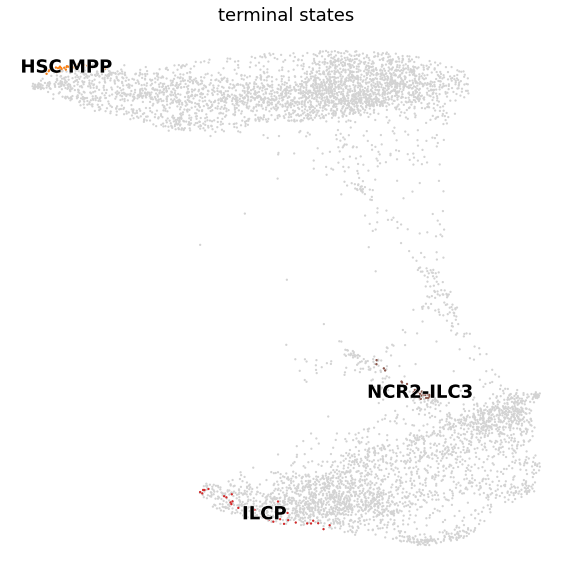

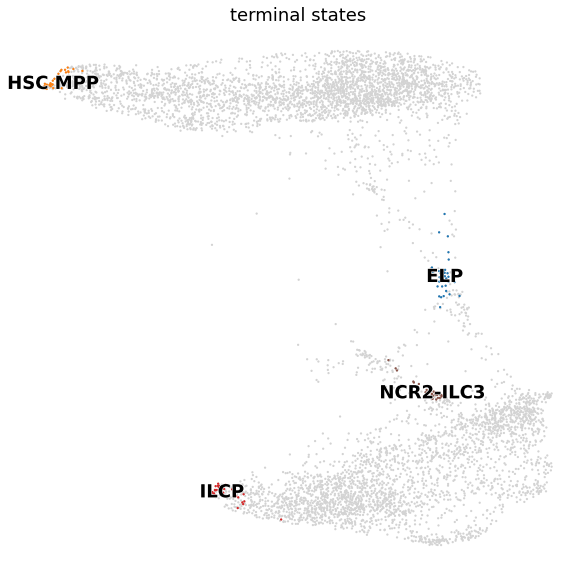

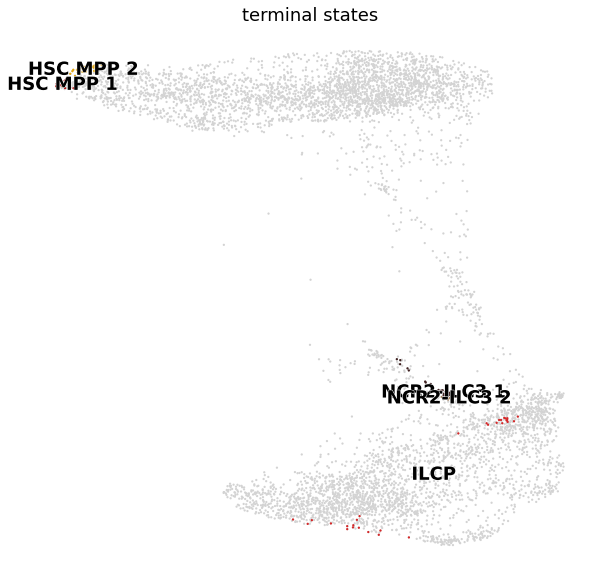

In [277]:
for n in [3,4,5]:
    cellrank.tl.terminal_states(scvelo_adata, 
                                cluster_key='anno_lvl_2', 
                                weight_connectivities=0.4,  ## How much weight to give to KNN graph vs RNA velocity directions
                                n_states=n
                                )

    cellrank.pl.terminal_states(scvelo_adata, basis="X_draw_graph_fa", discrete=True)


Pick 3 states (identifies the ILC2 cells)

In [278]:
cellrank.tl.terminal_states(scvelo_adata, 
                                cluster_key='anno_lvl_2', 
                                weight_connectivities=0.4, ## How much weight to give to KNN graph vs RNA velocity directions
                                n_states=3
                                )


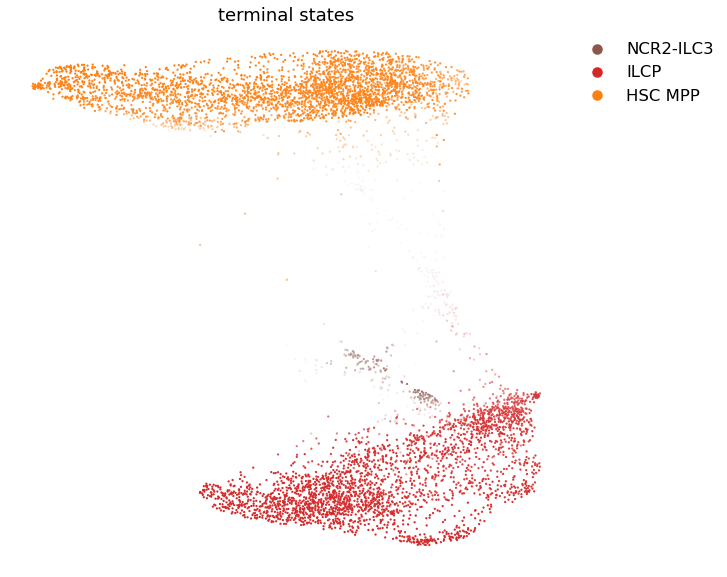

In [279]:
cellrank.pl.terminal_states(scvelo_adata, basis="X_draw_graph_fa")

Infer putative initial states

In [280]:
cellrank.tl.initial_states(scvelo_adata, cluster_key='anno_lvl_2', n_states=1)

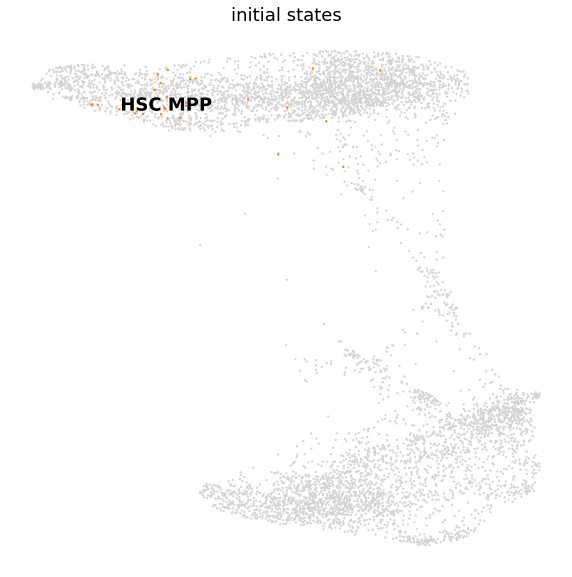

In [281]:
cellrank.pl.initial_states(scvelo_adata, basis="X_draw_graph_fa", discrete=True)

Estimate probability of differentiating into each terminal state

In [282]:
cellrank.tl.lineages(scvelo_adata)

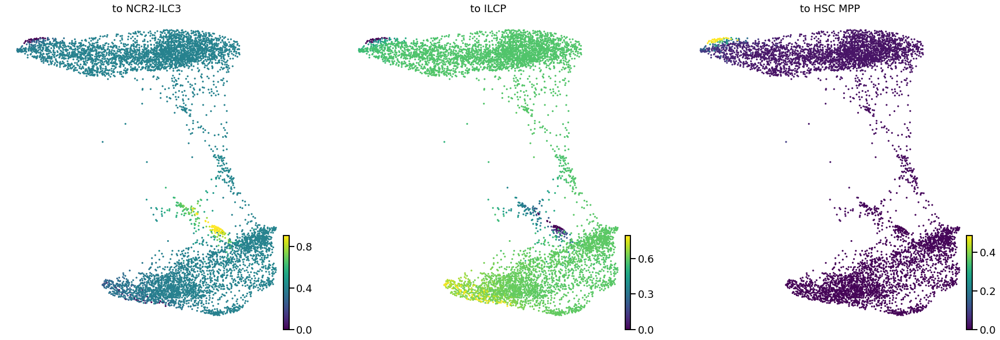

In [283]:
cellrank.pl.lineages(scvelo_adata, basis="X_draw_graph_fa", same_plot=False, size=40)

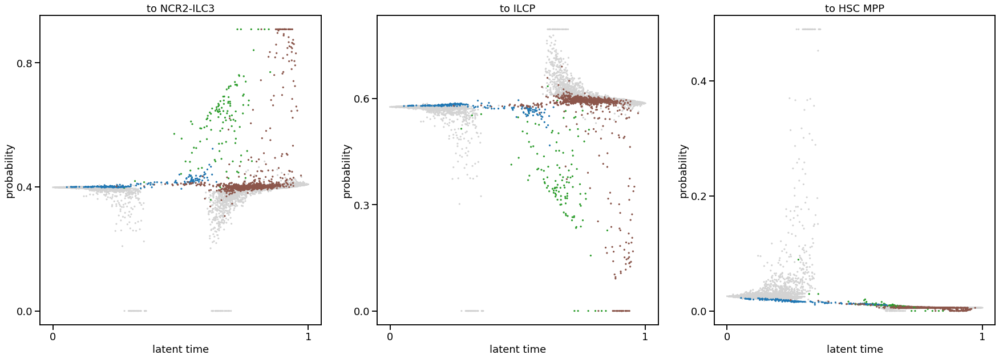

In [286]:
cellrank.pl.lineages(scvelo_adata, basis="X_draw_graph_fa", same_plot=True, mode="time", color="anno_lvl_2", groups=["ELP","ILC2", "NCR2-ILC3"], size=40)

### Save scVelo/cellrank results

In [289]:
scvelo_adata.write_h5ad(data_dir + 'tmp/ILC_scvelo_adata.h5ad')

---
---

# Old snippets

### Try dynamical model

In [ ]:
scv.tl.recover_dynamics(scvelo_adata)

In [ ]:
scv.tl.velocity(scvelo_adata, mode='dynamical')
scv.tl.velocity_graph(scvelo_adata)

In [ ]:
plt.rcParams["figure.figsize"] = [10,10]
scv.pl.velocity_embedding_stream(scvelo_adata, basis="X_draw_graph_fa", color="anno_lvl_2", linewidth=3)

In [ ]:
scv.pl.velocity_embedding(scvelo_adata, basis="X_draw_graph_fa", color="anno_lvl_2", arrow_length=10, arrow_size=3)

In [ ]:
scv.tl.velocity_confidence(scvelo_adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(scvelo_adata, c=keys, cmap='coolwarm', perc=[5, 95], basis="X_draw_graph_fa")

In [ ]:
scv.tl.latent_time(scvelo_adata)

In [ ]:
scv.pl.scatter(scvelo_adata, color='latent_time', color_map='gnuplot', size=20, basis="X_draw_graph_fa")

In [ ]:
plt.rcParams["figure.figsize"] = [7,7]
top_genes = scvelo_adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(scvelo_adata, basis=top_genes[:15], ncols=5, frameon=False, color="anno_lvl_2")

In [ ]:
scvelo_adata.var.sort_values("fit_likelihood", ascending=False)

### Define root for pseudotime inference

In [ ]:
# ## import utils
# cwd = '../6_trajectory_inference'
# sys.path.append(cwd)

# import ti_utils

In [ ]:
root_ix = ilc_adata.obsm["X_diffmap"][:,3].argmax()
ilc_adata.uns["iroot"] = root_ix

In [ ]:
ilc_adata.obs["is_root"] = [1 if x==ilc_adata.uns["iroot"] else 0 for x in range(ilc_adata.n_obs)]
sc.pl.draw_graph(ilc_adata, color="is_root", size=100, cmap="Reds")
sc.pl.diffmap(ilc_adata, color="is_root", size=100, cmap="Reds",components=['1,2','2,3'])

### General DPT

In [ ]:
## rename because of bug in cellrank
ilc_adata.obsp["connectivities"] = ilc_adata.obsp["scvi_connectivities"]
ilc_adata.obsp["distances"] = ilc_adata.obsp["scvi_distances"]

ilc_adata.uns["neighbors"] = ilc_adata.uns["scvi"]

ctk = ConnectivityKernel(ilc_adata)

In [ ]:
import slepc4py

In [ ]:
g = cellrank.tl.estimators.GPCCA(ctk)
g.compute_gdpt(method="krylov")

In [ ]:
sc.pl.draw_graph(ilc_adata, color="gdpt_pseudotime", size=100, cmap="Reds")

In [ ]:
sc.pl.violin(ilc_adata, keys=['gdpt_pseudotime'], groupby='anno_lvl_2', rotation=90, order=subset_annos)

### Trajectory with NK cells

In [ ]:
subset_annos = ['HSC_MPP','ELP','ILCP','ILC2','NCR2+ILC3','NCR2-ILC3', "NK"]

In [ ]:
ilc_nk_adata = adata[adata.obs["anno_lvl_2"].isin(subset_annos)]

In [ ]:
ilc_nk_adata

We subset to 3GEX data to use for velocity analysis

In [ ]:
ilc_nk_adata = ilc_nk_adata[ilc_nk_adata.obs["method"] == '3GEX']

In [ ]:
sc.pp.neighbors(ilc_nk_adata, use_rep = "X_scvi", n_neighbors = 15, key_added="scvi")

In [ ]:
sc.tl.draw_graph(ilc_nk_adata, neighbors_key="scvi")

In [ ]:
plt.rcParams["figure.figsize"] = [12,12]
scv.pl.draw_graph(ilc_nk_adata, color="anno_lvl_2", legend_loc="on data", size=40)

Exclude cycling

In [ ]:
ilc_nk_adata.obs['exclude_cycling'] = (ilc_nk_adata[:,"MKI67"].X.toarray() >= 1).astype('int')
# sc.pl.draw_graph(ilc_nk_adata, color=["MKI67", "exclude_cycling"], legend_loc="on data")

In [ ]:
ilc_nk_adata = ilc_nk_adata[ilc_nk_adata.obs["exclude_cycling"] == 0]

In [ ]:
sc.pp.neighbors(ilc_nk_adata, use_rep = "X_scvi", n_neighbors = 15, key_added="scvi")

In [ ]:
sc.tl.draw_graph(ilc_nk_adata, neighbors_key="scvi")

In [ ]:
plt.rcParams["figure.figsize"] = [12,12]
sc.pl.draw_graph(ilc_nk_adata, color="anno_lvl_2", legend_loc="on data")

### Velocity

In [ ]:
ilc_nk_adata

In [ ]:
scvelo_adata = sc.read_h5ad(data_dir + "tmp/velocity_adata.h5ad")

In [ ]:
scvelo_adata = scvelo_adata[scvelo_adata.obs_names.isin(ilc_nk_adata.obs_names)]

In [ ]:
scvelo_adata.obs = ilc_nk_adata[scvelo_adata.obs_names].obs.copy()
scvelo_adata = scvelo_adata[scvelo_adata.obs["method"] == "3GEX"]
scvelo_adata.obsm["X_scvi"] = ilc_nk_adata[scvelo_adata.obs_names].obsm["X_scvi"]

In [ ]:
scvelo_adata.obs_names

In [ ]:
scvelo_adata.obsm["X_draw_graph_fa"] = ilc_nk_adata[scvelo_adata.obs_names].obsm["X_draw_graph_fa"]
scvelo_adata.uns['draw_graph'] = ilc_nk_adata.uns['draw_graph'].copy()
scvelo_adata.obsm["X_draw_graph_fa"] =scvelo_adata.obsm["X_draw_graph_fa"].toarray()

In [ ]:
scv.pp.filter_and_normalize(scvelo_adata, min_shared_counts=10, n_top_genes=3000)
sc.pp.neighbors(scvelo_adata, n_pcs=30, n_neighbors=15, use_rep="X_scvi")

In [ ]:
scv.pp.moments(scvelo_adata, n_pcs=None, n_neighbors=None)

### Estimate velocity

In [ ]:
scv.tl.recover_dynamics(scvelo_adata)

In [ ]:
scv.tl.velocity(scvelo_adata, mode='dynamical')
scv.tl.velocity_graph(scvelo_adata)

In [ ]:
scv.tl.latent_time(scvelo_adata)

In [ ]:
plt.rcParams["figure.figsize"] = [10,10]
scvelo_adata.obs["age"] = scvelo_adata.obs["age"].astype("float64")
scv.pl.velocity_embedding_stream(scvelo_adata, basis="X_draw_graph_fa", color=["anno_lvl_2", 'age'], linewidth=4)

In [ ]:
scv.pl.draw_graph(scvelo_adata, color="anno_lvl_2", groups="NK")